#Introduction to Linear Algebra and the world of probablitites


##Singular Value Decomposition




In [1]:
import matplotlib.pyplot as plt
import numpy as np
import time

from PIL import Image

Lets load the image and convert that to a gray-scale version (so that we can treat it just like a 2D matrix). What will happen if its not gray-scale?

Anwser: If the image is not grayscale, it has three (or more) color channels, so it’s a 3D array instead of a 2D matrix.
SVD only works properly on 2D data, so: it will give an error, or produce wrong or messy results (because colors get mixed together).



###First example - satellite image of natural terrain, in this case - permafrost in Yakutia. 

In [31]:
img = Image.open("melting_permafrost.png")
imggray = img.convert('L')

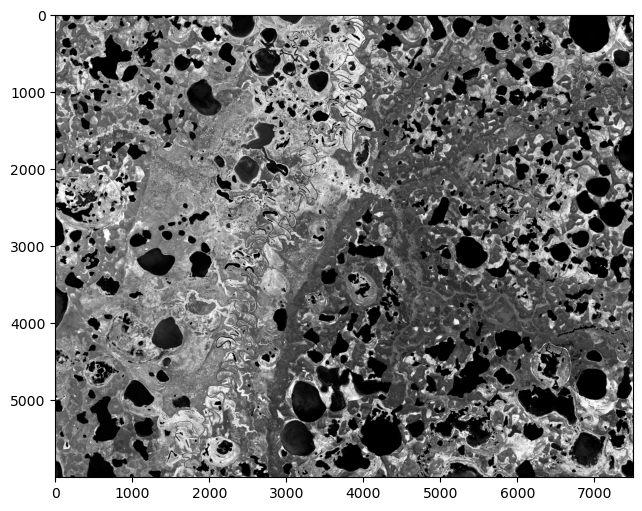

In [32]:
imgmat = np.array(list(imggray.getdata(band=0)), float)
imgmat.shape = (imggray.size[1], imggray.size[0])
imgmat = np.matrix(imgmat)
plt.figure(figsize=(9,6))
plt.imshow(imgmat, cmap='gray')

###SVD

We can directly use the $svd$ command from Numpy to operate SVD on the matrix.

Lets first check how the image will look if we only use a single vector to reconstruct the image.

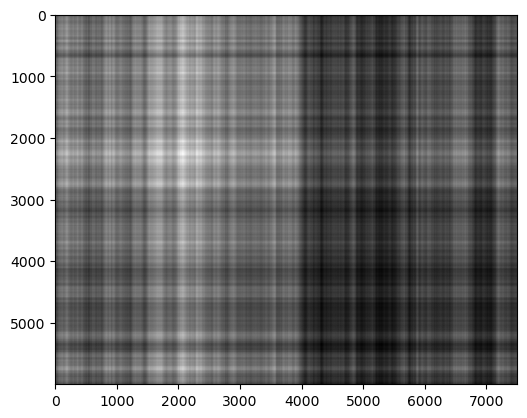

In [33]:
U, sigma, V = np.linalg.svd(imgmat)
reconstimg = np.matrix(U[:, :1]) * np.diag(sigma[:1]) * np.matrix(V[:1, :])
plt.imshow(reconstimg, cmap='gray');

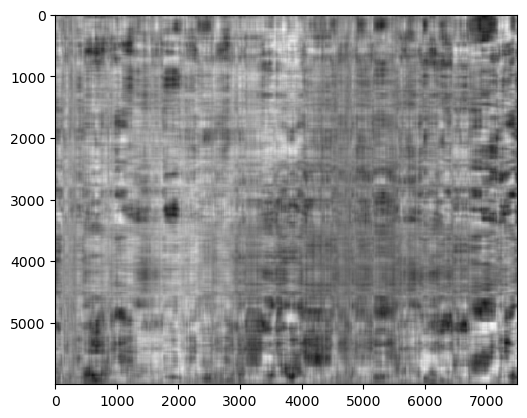

In [34]:
U, sigma, V = np.linalg.svd(imgmat)
reconstimg = np.matrix(U[:, :10]) * np.diag(sigma[:10]) * np.matrix(V[:10, :])
plt.imshow(reconstimg, cmap='gray');


Now lets check how does the sigma vector look like.

What do you observe? How many vecotrs can we use to get a decent reconstruction of the image?
What will happen if we omit the first 1-2 vectors (corresponding to the largest eigen values)?

Answer below.



(6000, 6000)
(6000,)


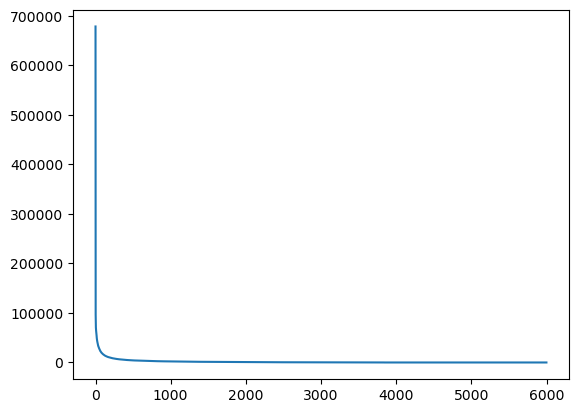

In [35]:
print(U.shape)
print(sigma.shape)
plt.plot(sigma)

###Reconstruction

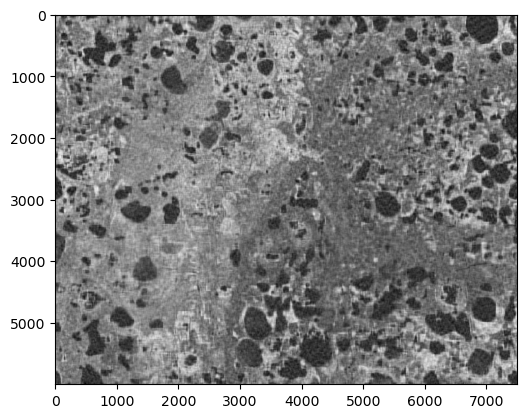

In [36]:
i = 70
j = 0
reconstimg = np.matrix(U[:, j:i]) * np.diag(sigma[j:i]) * np.matrix(V[j:i, :])
plt.imshow(reconstimg, cmap='gray');

###Reconstruction with ommiting first values results in less pronounced image, the permaforst lakes are less distinct.

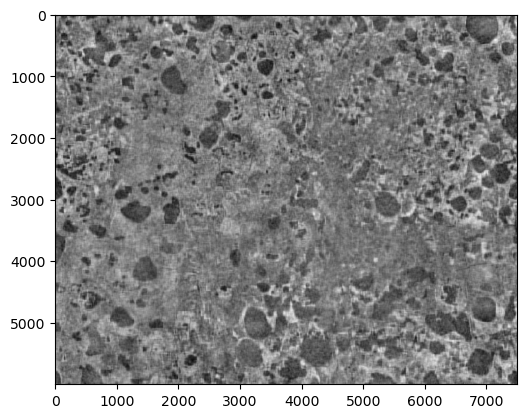

In [37]:
i = 70
j = 3
reconstimg = np.matrix(U[:, j:i]) * np.diag(sigma[j:i]) * np.matrix(V[j:i, :])
plt.imshow(reconstimg, cmap='gray');

###Reconstruction for different singular values

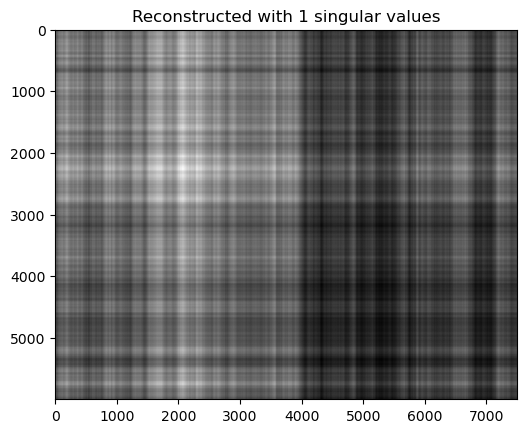

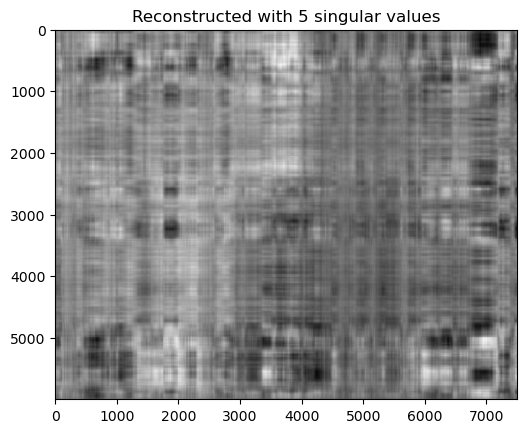

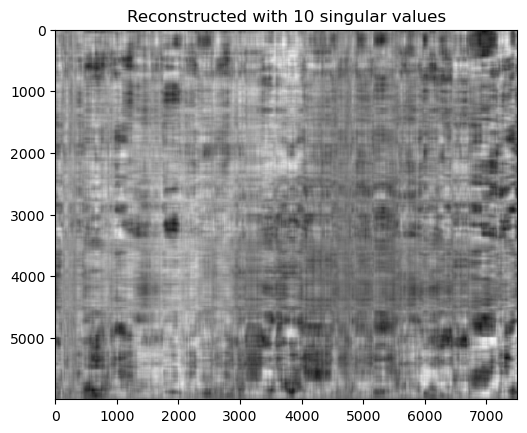

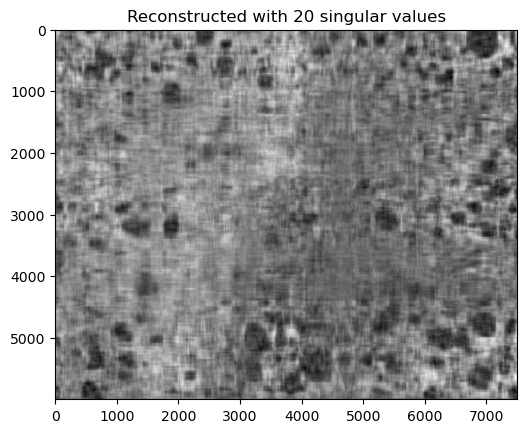

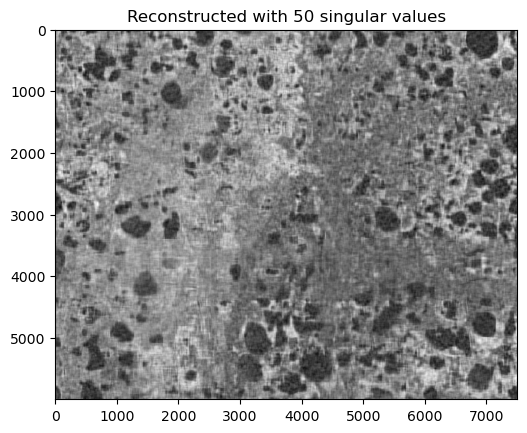

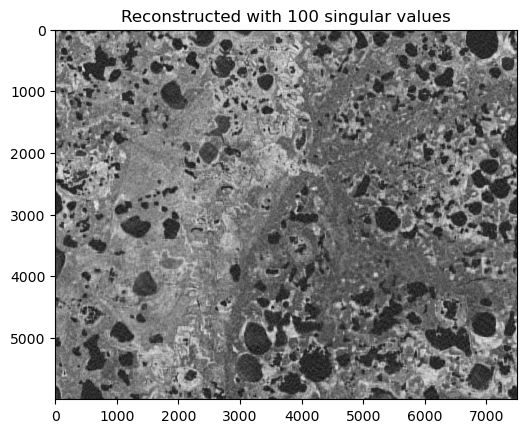

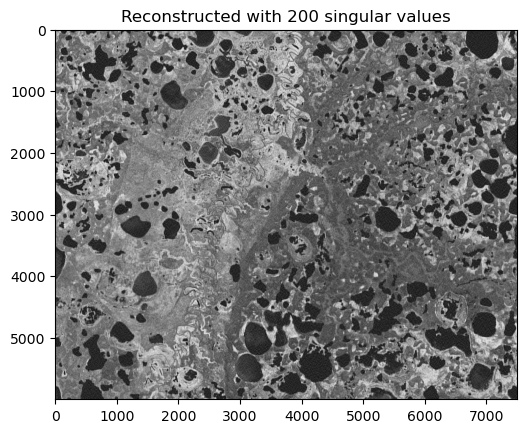

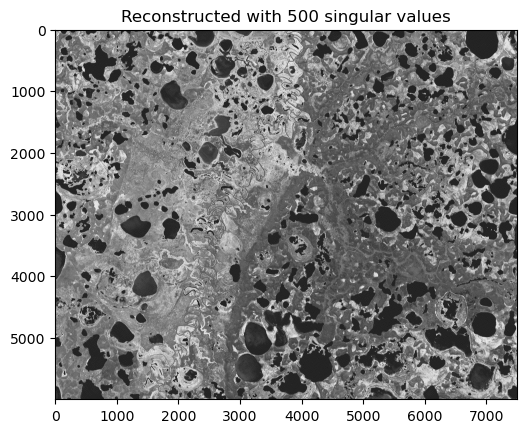

In [38]:
for k in [1, 5, 10, 20, 50, 100, 200, 500]:
    reconst = np.matrix(U[:, :k]) * np.diag(sigma[:k]) * np.matrix(V[:k, :])
    plt.imshow(reconst, cmap='gray')
    plt.title(f'Reconstructed with {k} singular values')
    plt.show()

###It is clearly seen that Melting permafrost needs high k, more than 100. Pictures recinstructed with 200 and 500 singular values are very well pronounced. 

###Second example - satellite image of a city, in this case - Rzeszów, Poland.

We calculate SVD on a more urbanized area—Rzeszów city center. 
- download Sentinel-2 data, 
- select the RGB bands + normalizaton 
- extract AOI


Using tile: S2C_MSIL2A_20250920T094041_N0511_R036_T34UEA_20250920T130302.SAFE\GRANULE\L2A_T34UEA_A005440_20250920T094522\IMG_DATA\R10m\T34UEA_20250920T094041_B04_10m.jp2


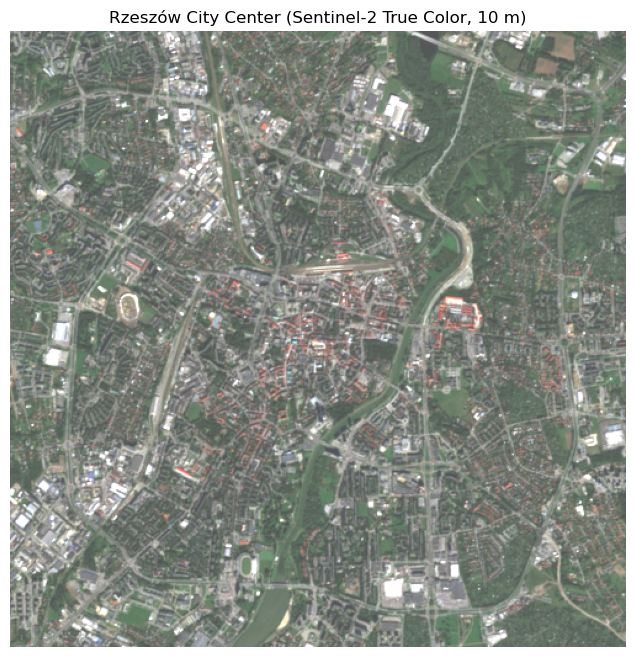

In [39]:
import os, glob
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from rasterio.windows import from_bounds, Window
from pyproj import Transformer


safe_root = r"S2C_MSIL2A_20250920T094041_N0511_R036_T34UEA_20250920T130302.SAFE"
lon, lat  = 22.0047, 50.0379   # Rzeszów center
dx, dy    = 2500, 2500         


def find_rgb_triplets(safe_root):
    b04s = glob.glob(os.path.join(safe_root, "GRANULE", "*", "IMG_DATA", "R10m", "*_B04_10m.jp2"))
    trips = []
    for b4 in b04s:
        base = os.path.basename(b4).replace("B04","{band}")
        folder = os.path.dirname(b4)
        b03 = os.path.join(folder, base.format(band="B03"))
        b02 = os.path.join(folder, base.format(band="B02"))
        if os.path.exists(b03) and os.path.exists(b02):
            trips.append((b4, b03, b02))
    return trips

triplets = find_rgb_triplets(safe_root)
if not triplets:
    raise RuntimeError("No R10m RGB triplets found under SAFE/GRANULE/*/IMG_DATA/R10m")


def point_in_bounds(x, y, bounds):
    xmin, ymin, xmax, ymax = bounds
    return (xmin <= x <= xmax) and (ymin <= y <= ymax)

best = None
best_dist = float("inf")

for b4, b3, b2 in triplets:
    with rasterio.open(b4) as src:
        tfm = Transformer.from_crs("EPSG:4326", src.crs, always_xy=True)
        x, y = tfm.transform(lon, lat)
        if point_in_bounds(x, y, src.bounds):
            best = (b4, b3, b2, x, y, src.transform, src.width, src.height, src.bounds, src.crs)
            break
        
        cx = (src.bounds.left + src.bounds.right)/2
        cy = (src.bounds.top  + src.bounds.bottom)/2
        d  = ( (x-cx)**2 + (y-cy)**2 )**0.5
        if d < best_dist:
            best_dist = d
            best = (b4, b3, b2, x, y, src.transform, src.width, src.height, src.bounds, src.crs)

b4_path, b3_path, b2_path, x, y, ref_transform, W, H, ref_bounds, ref_crs = best
print("Using tile:", b4_path)


xmin, ymin, xmax, ymax = x - dx, y - dy, x + dx, y + dy
win = from_bounds(xmin, ymin, xmax, ymax, transform=ref_transform)
win = Window(col_off=max(0, win.col_off),
             row_off=max(0, win.row_off),
             width=min(win.width,  W - max(0, win.col_off)),
             height=min(win.height, H - max(0, win.row_off)))


win = Window(int(round(win.col_off)), int(round(win.row_off)),
             int(round(win.width)),  int(round(win.height)))


with rasterio.open(b4_path) as r:
    b4 = r.read(1, window=win)
with rasterio.open(b3_path) as g:
    b3 = g.read(1, window=win)
with rasterio.open(b2_path) as b:
    b2 = b.read(1, window=win)


rgb = np.dstack([b4, b3, b2]).astype(np.float32)
p = np.percentile(rgb, 99, axis=(0,1))
p[p == 0] = 1.0
rgb /= p
rgb = np.clip(rgb, 0, 1)


plt.figure(figsize=(8,8))
plt.imshow(rgb)
plt.title("Rzeszów City Center (Sentinel-2 True Color, 10 m)")
plt.axis("off")
plt.show()


###Grayscale image is then used for SVD calculations as shown in the following code cells.

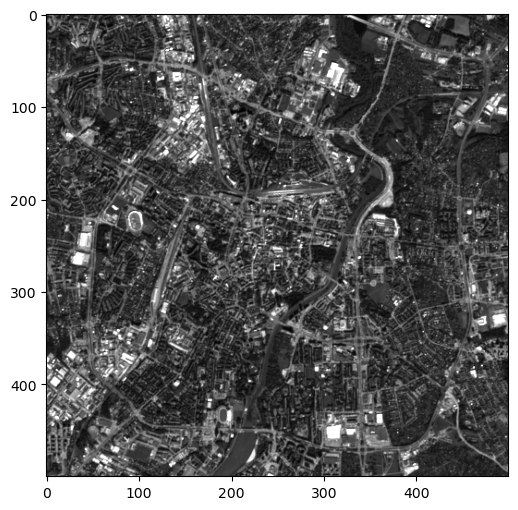

In [40]:
from PIL import Image
import numpy as np

rgb_uint8 = (rgb * 255).astype(np.uint8)
img = Image.fromarray(rgb_uint8)
imggray = img.convert('L')

imgmat = np.array(list(imggray.getdata(band=0)), float)
imgmat.shape = (imggray.size[1], imggray.size[0])
imgmat = np.matrix(imgmat)
plt.figure(figsize=(9,6))
plt.imshow(imgmat, cmap='gray')

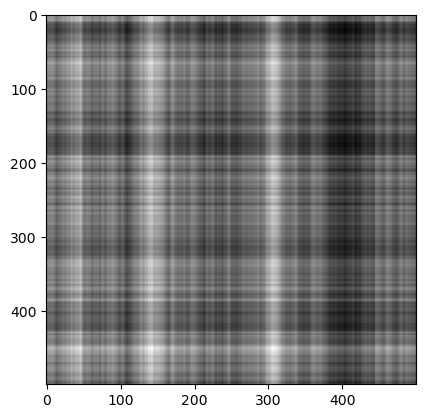

In [41]:
U, sigma, V = np.linalg.svd(imgmat)
reconstimg = np.matrix(U[:, :1]) * np.diag(sigma[:1]) * np.matrix(V[:1, :])
plt.imshow(reconstimg, cmap='gray');

(500, 500)
(500,)


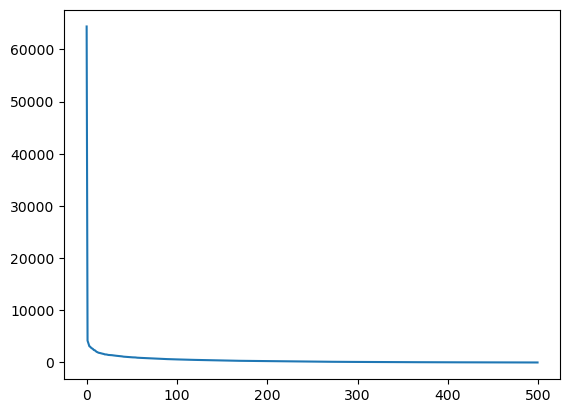

In [42]:
print(U.shape)
print(sigma.shape)
plt.plot(sigma)

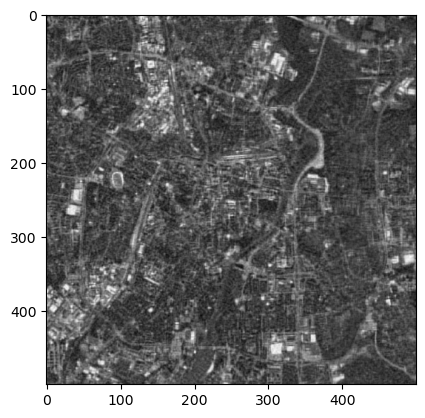

In [43]:
i = 80
j = 0
reconstimg = np.matrix(U[:, j:i]) * np.diag(sigma[j:i]) * np.matrix(V[j:i, :])
plt.imshow(reconstimg, cmap='gray');

###Reconstruction with ommiting first values results (again) in less pronounced image, the characterstics of the urban area are less distinct.

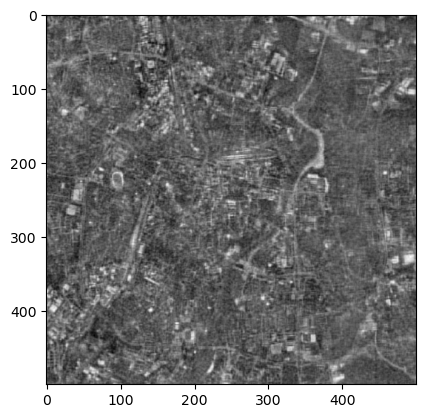

In [45]:
i = 70
j = 3
reconstimg = np.matrix(U[:, j:i]) * np.diag(sigma[j:i]) * np.matrix(V[j:i, :])
plt.imshow(reconstimg, cmap='gray');

###Reconstruction for different singular values

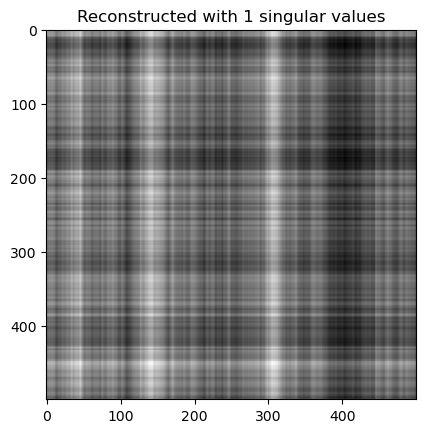

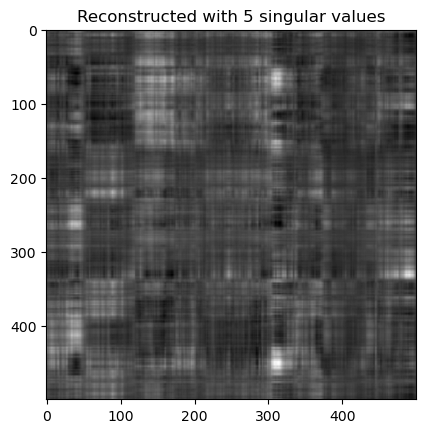

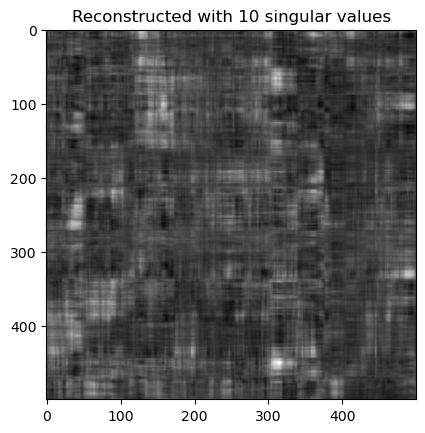

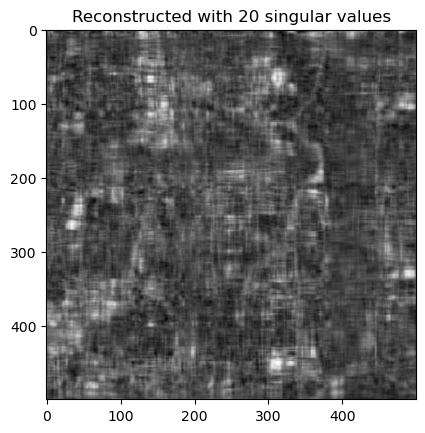

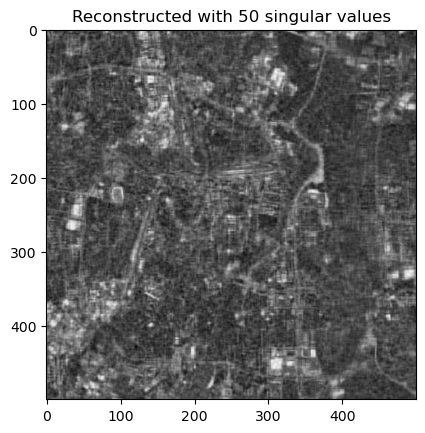

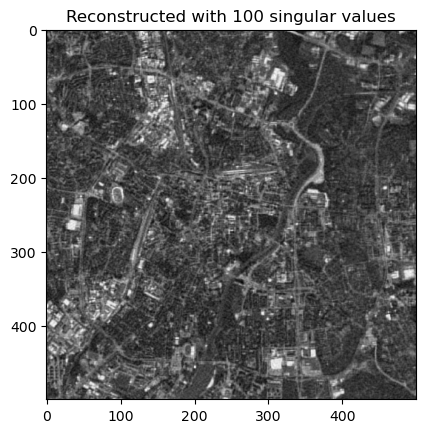

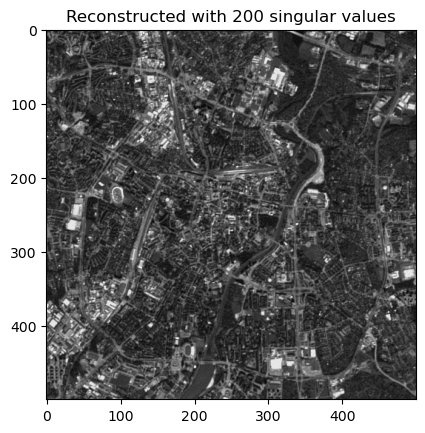

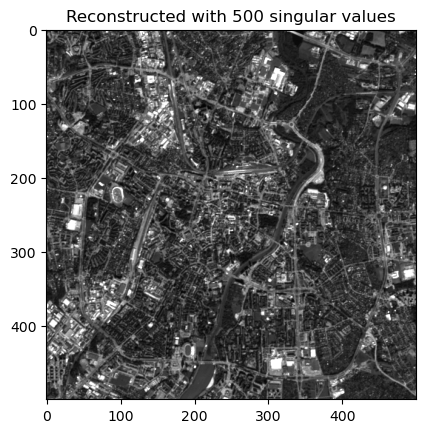

In [44]:
for k in [1, 5, 10, 20, 50, 100, 200, 500]:
    reconst = np.matrix(U[:, :k]) * np.diag(sigma[:k]) * np.matrix(V[:k, :])
    plt.imshow(reconst, cmap='gray')
    plt.title(f'Reconstructed with {k} singular values')
    plt.show()

In case of urban area aboout 80 - 100 eigen/singular values are good enough, but  the near perfect images are reconstructed with higher values. 

###Third example - satellite image of a forest, in this case - near Rzeszów, Poland.

Using tile: S2C_MSIL2A_20250920T094041_N0511_R036_T34UEA_20250920T130302.SAFE\GRANULE\L2A_T34UEA_A005440_20250920T094522\IMG_DATA\R10m\T34UEA_20250920T094041_B04_10m.jp2


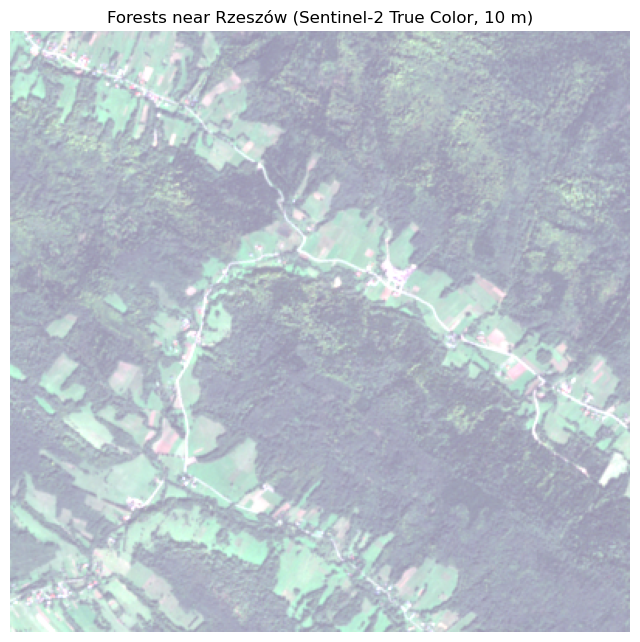

In [2]:
import os, glob
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from rasterio.windows import from_bounds, Window
from pyproj import Transformer


safe_root = r"S2C_MSIL2A_20250920T094041_N0511_R036_T34UEA_20250920T130302.SAFE"
lon, lat  = 22.4268, 49.5729   # podcarpathian forests
dx, dy    = 2000, 2000         


def find_rgb_triplets(safe_root):
    b04s = glob.glob(os.path.join(safe_root, "GRANULE", "*", "IMG_DATA", "R10m", "*_B04_10m.jp2"))
    trips = []
    for b4 in b04s:
        base = os.path.basename(b4).replace("B04","{band}")
        folder = os.path.dirname(b4)
        b03 = os.path.join(folder, base.format(band="B03"))
        b02 = os.path.join(folder, base.format(band="B02"))
        if os.path.exists(b03) and os.path.exists(b02):
            trips.append((b4, b03, b02))
    return trips

triplets = find_rgb_triplets(safe_root)
if not triplets:
    raise RuntimeError("No R10m RGB triplets found under SAFE/GRANULE/*/IMG_DATA/R10m")


def point_in_bounds(x, y, bounds):
    xmin, ymin, xmax, ymax = bounds
    return (xmin <= x <= xmax) and (ymin <= y <= ymax)

best = None
best_dist = float("inf")

for b4, b3, b2 in triplets:
    with rasterio.open(b4) as src:
        tfm = Transformer.from_crs("EPSG:4326", src.crs, always_xy=True)
        x, y = tfm.transform(lon, lat)
        if point_in_bounds(x, y, src.bounds):
            best = (b4, b3, b2, x, y, src.transform, src.width, src.height, src.bounds, src.crs)
            break
        
        cx = (src.bounds.left + src.bounds.right)/2
        cy = (src.bounds.top  + src.bounds.bottom)/2
        d  = ( (x-cx)**2 + (y-cy)**2 )**0.5
        if d < best_dist:
            best_dist = d
            best = (b4, b3, b2, x, y, src.transform, src.width, src.height, src.bounds, src.crs)

b4_path, b3_path, b2_path, x, y, ref_transform, W, H, ref_bounds, ref_crs = best
print("Using tile:", b4_path)


xmin, ymin, xmax, ymax = x - dx, y - dy, x + dx, y + dy
win = from_bounds(xmin, ymin, xmax, ymax, transform=ref_transform)
win = Window(col_off=max(0, win.col_off),
             row_off=max(0, win.row_off),
             width=min(win.width,  W - max(0, win.col_off)),
             height=min(win.height, H - max(0, win.row_off)))


win = Window(int(round(win.col_off)), int(round(win.row_off)),
             int(round(win.width)),  int(round(win.height)))


with rasterio.open(b4_path) as r:
    b4 = r.read(1, window=win)
with rasterio.open(b3_path) as g:
    b3 = g.read(1, window=win)
with rasterio.open(b2_path) as b:
    b2 = b.read(1, window=win)


rgb = np.dstack([b4, b3, b2]).astype(np.float32)
p = np.percentile(rgb, 99, axis=(0,1))
p[p == 0] = 1.0
rgb /= p
rgb = np.clip(rgb, 0, 1)


plt.figure(figsize=(8,8))
plt.imshow(rgb)
plt.title("Forests near Rzeszów (Sentinel-2 True Color, 10 m)")
plt.axis("off")
plt.show()


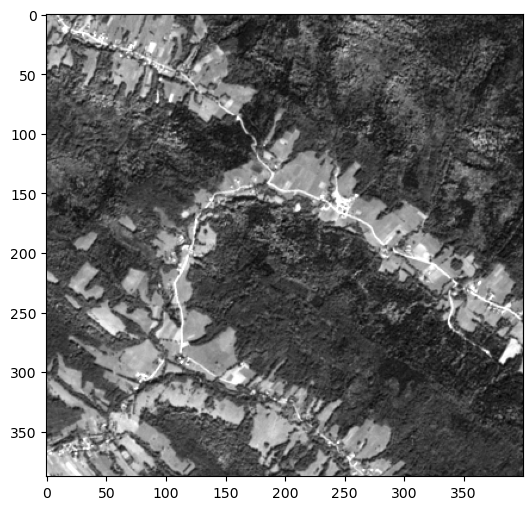

In [3]:
from PIL import Image
import numpy as np

rgb_uint8 = (rgb * 255).astype(np.uint8)
img = Image.fromarray(rgb_uint8)
imggray = img.convert('L')

imgmat = np.array(list(imggray.getdata(band=0)), float)
imgmat.shape = (imggray.size[1], imggray.size[0])
imgmat = np.matrix(imgmat)
plt.figure(figsize=(9,6))
plt.imshow(imgmat, cmap='gray')

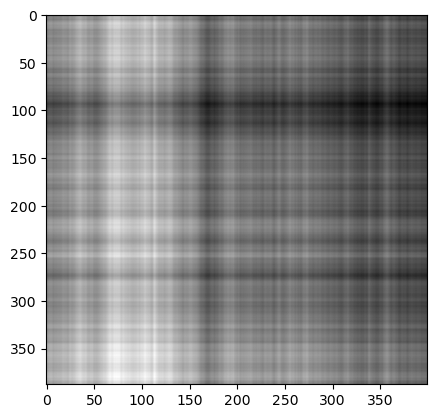

In [4]:
U, sigma, V = np.linalg.svd(imgmat)
reconstimg = np.matrix(U[:, :1]) * np.diag(sigma[:1]) * np.matrix(V[:1, :])
plt.imshow(reconstimg, cmap='gray');

(388, 388)
(388,)


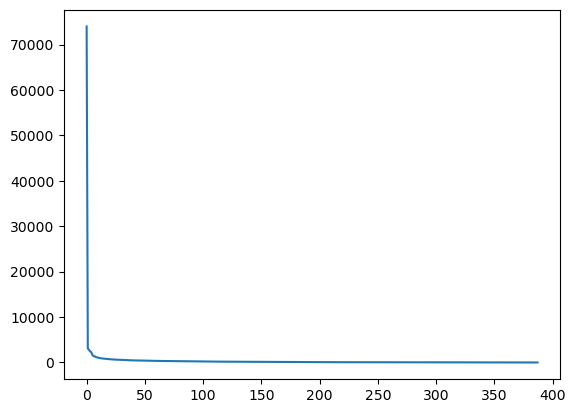

In [5]:
print(U.shape)
print(sigma.shape)
plt.plot(sigma)

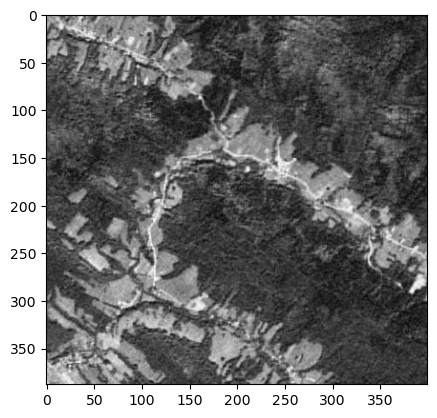

In [6]:
i = 80
j = 0
reconstimg = np.matrix(U[:, j:i]) * np.diag(sigma[j:i]) * np.matrix(V[j:i, :])
plt.imshow(reconstimg, cmap='gray');

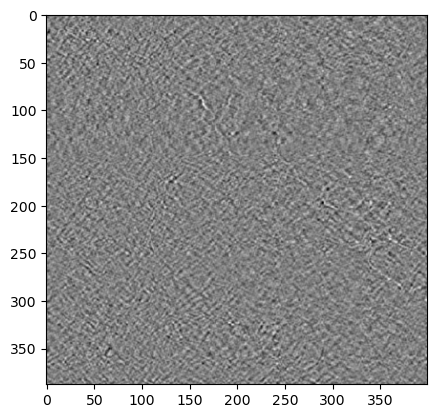

In [11]:
i = 80
j = 53
reconstimg = np.matrix(U[:, j:i]) * np.diag(sigma[j:i]) * np.matrix(V[j:i, :])
plt.imshow(reconstimg, cmap='gray');

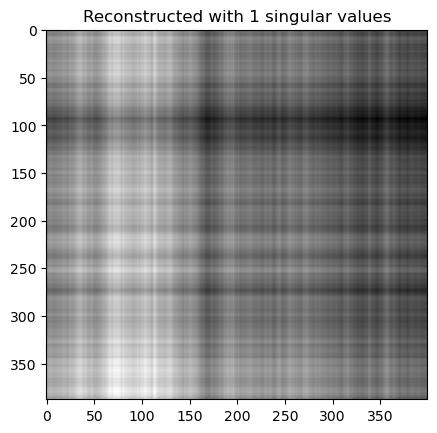

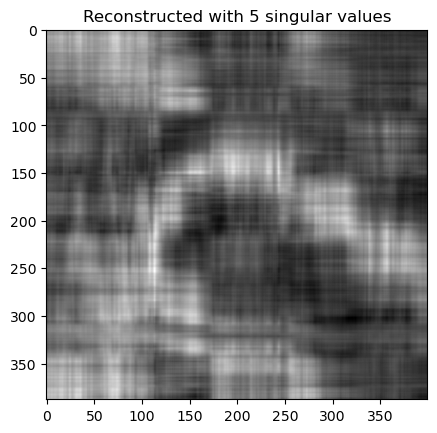

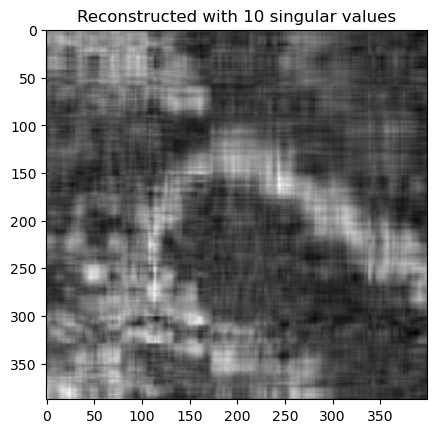

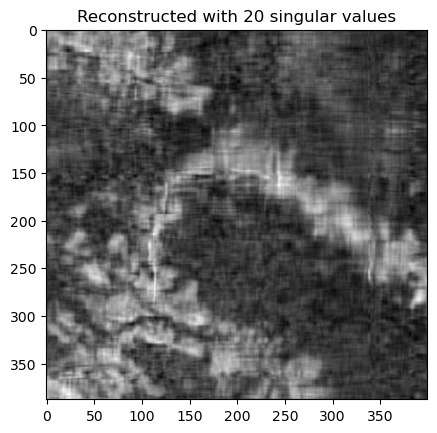

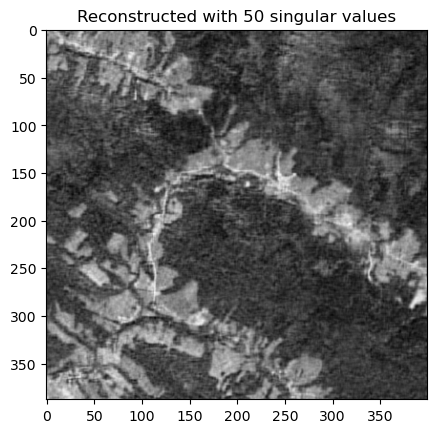

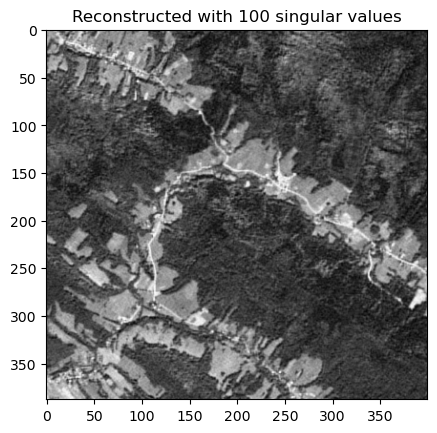

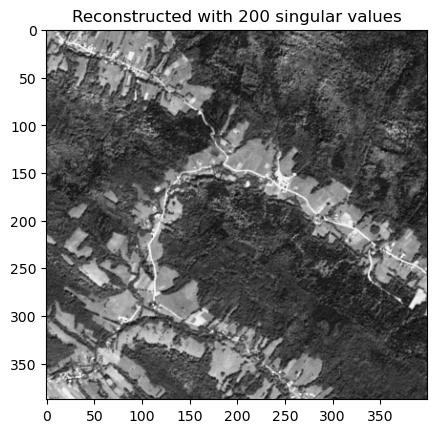

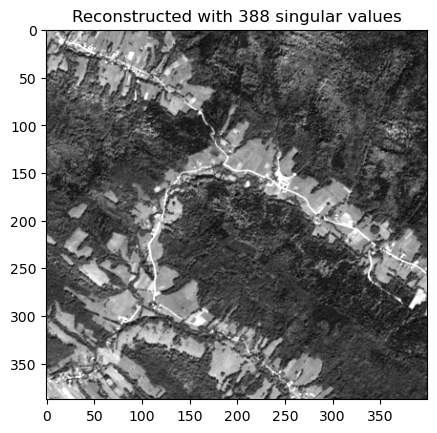

In [9]:
for k in [1, 5, 10, 20, 50, 100, 200, 388]:
    reconst = np.matrix(U[:, :k]) * np.diag(sigma[:k]) * np.matrix(V[:k, :])
    plt.imshow(reconst, cmap='gray')
    plt.title(f'Reconstructed with {k} singular values')
    plt.show()

###Once again the same schema occured, less than 50 singular values are not enough for good reconstruction. 

Key takeaways that answers questions in the instruction:

###If we use the 10th, 11th, and so on up to k+10 eigenvalues instead of the largest ones, the image quality actually becomes worse. The reason is that the largest eigenvalues contain the most important information about the image, such as its overall structure, brightness, and main shapes. When we skip those and use only the smaller, middle ones, we lose that essential information. The reconstructed images then appear darker, noisier, and without clear shapes or contrast.

###When we test this on satellite images of different terrains, the number of eigenvalues needed for a good reconstruction depends on how complex the terrain is. Urban areas need more, to bring back the structure of roads, buildings, and shadows. Forests and rough terrains like melting permafrost need even more, because they have a lot of texture and small variations that require higher eigenvalues to capture. Probably, for smooth areas like oceans or large water bodies, less eigenvalues are enough to recreate the image clearly.